In [37]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

In [13]:
import pathlib
data_dir = 'mushroom'
data_dir = pathlib.Path(data_dir).with_suffix('')

In [14]:
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)

400


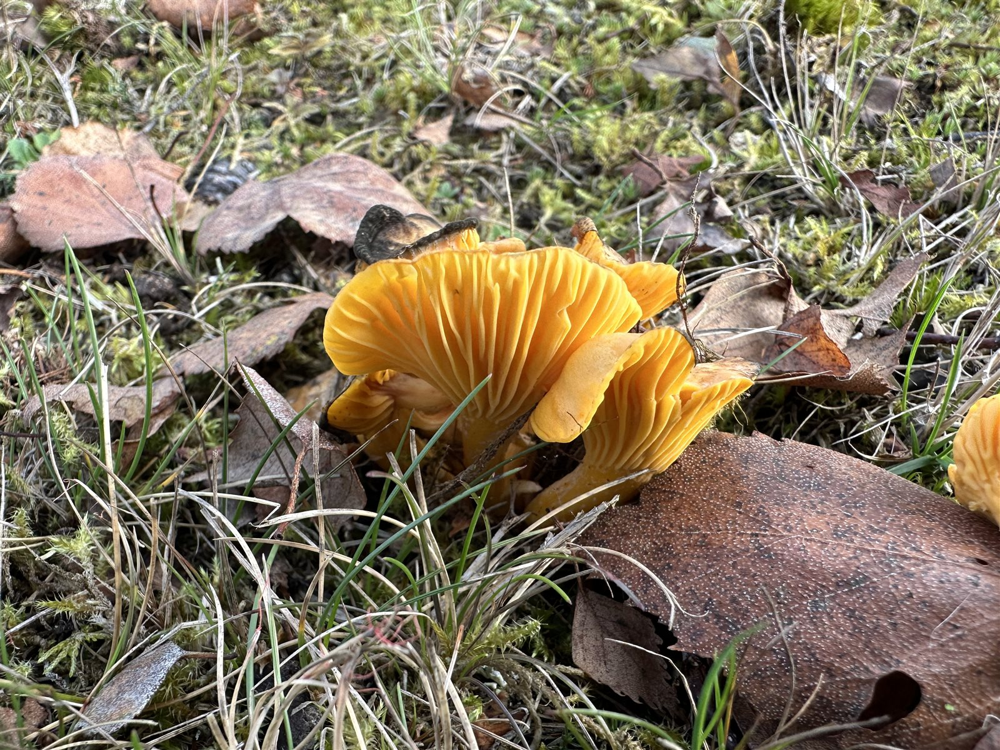

In [17]:
import PIL

kantareller = list(data_dir.glob('*kantarell/*.jpg'))
PIL.Image.open(str(kantareller[0]))

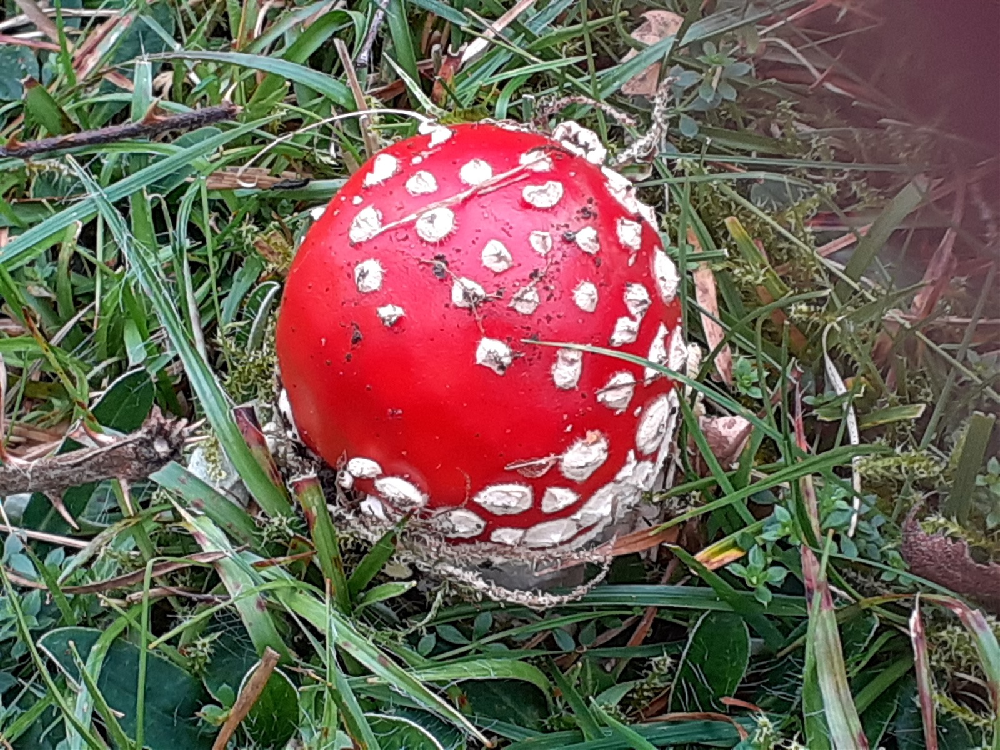

In [18]:
import PIL

flugsvampar = list(data_dir.glob('*flugsvamp/*.jpg'))
PIL.Image.open(str(flugsvampar[0]))

In [19]:
BATCH_SIZE = 32
IMG_SIZE = (160, 160)

In [24]:
train_dataset = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset="training",
    seed=123,
    batch_size=BATCH_SIZE,
    image_size=IMG_SIZE)

Found 400 files belonging to 2 classes.
Using 320 files for training.


In [25]:
val_dataset = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset="validation",
    seed=123,
    batch_size=BATCH_SIZE,
    image_size=IMG_SIZE)

Found 400 files belonging to 2 classes.
Using 80 files for validation.


In [27]:
class_names = train_dataset.class_names
print(class_names)

['flugsvamp', 'kantarell']


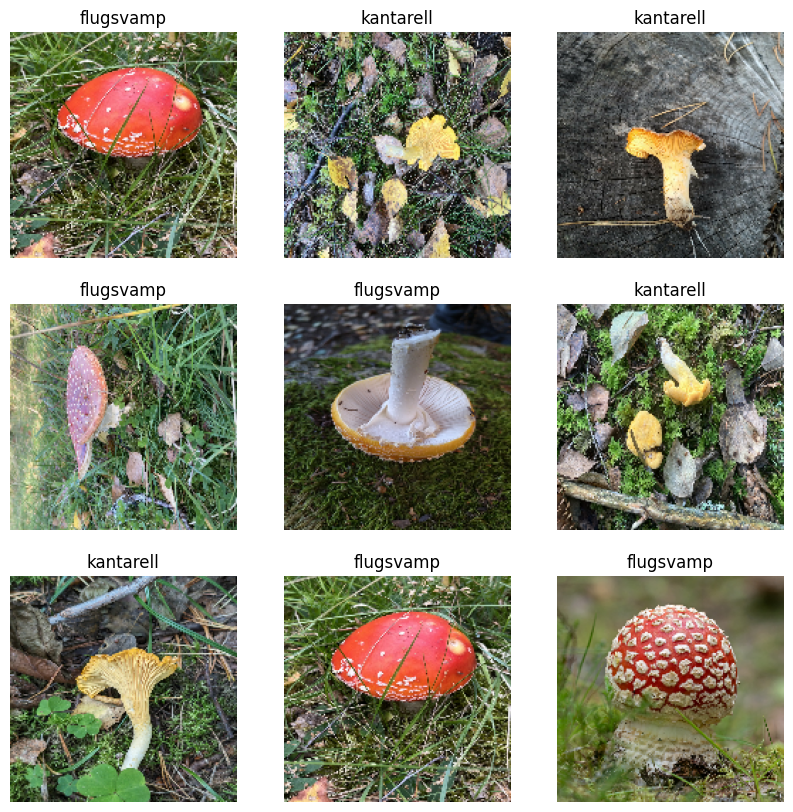

In [29]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_dataset.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [30]:
AUTOTUNE = tf.data.AUTOTUNE

train_dataset = train_dataset.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_dataset = val_dataset.cache().prefetch(buffer_size=AUTOTUNE)

In [31]:
normalization_layer = tf.keras.layers.Rescaling(1./255)

In [33]:
normalized_ds = train_dataset.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
# Notice the pixel values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image))

0.0 1.0


In [43]:
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

num_classes = len(class_names)

model = Sequential([
  layers.Rescaling(1./255, input_shape=(160, 160, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])



In [44]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy'])


In [45]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_2 (Rescaling)     (None, 160, 160, 3)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 160, 160, 16)      448       
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 80, 80, 16)        0         
 g2D)                                                            
                                                                 
 conv2d_4 (Conv2D)           (None, 80, 80, 32)        4640      
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 40, 40, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_5 (Conv2D)           (None, 40, 40, 64)       

In [46]:
epochs=10
history = model.fit(
  train_dataset,
  validation_data=val_dataset,
  epochs=epochs
)

Epoch 1/10
10/10 [==============================] - 4s 291ms/step - loss: 0.7598 - accuracy: 0.6406 - val_loss: 0.5543 - val_accuracy: 0.9250
Epoch 2/10
10/10 [==============================] - 2s 236ms/step - loss: 0.4067 - accuracy: 0.9156 - val_loss: 0.2503 - val_accuracy: 0.9625
Epoch 3/10
10/10 [==============================] - 2s 238ms/step - loss: 0.1376 - accuracy: 0.9812 - val_loss: 0.0477 - val_accuracy: 1.0000
Epoch 4/10
10/10 [==============================] - 2s 232ms/step - loss: 0.0265 - accuracy: 1.0000 - val_loss: 0.0065 - val_accuracy: 1.0000
Epoch 5/10
10/10 [==============================] - 2s 235ms/step - loss: 0.0036 - accuracy: 1.0000 - val_loss: 7.0729e-04 - val_accuracy: 1.0000
Epoch 6/10
10/10 [==============================] - 2s 228ms/step - loss: 7.3996e-04 - accuracy: 1.0000 - val_loss: 3.4085e-04 - val_accuracy: 1.0000
Epoch 7/10
10/10 [==============================] - 2s 222ms/step - loss: 2.0297e-04 - accuracy: 1.0000 - val_loss: 1.3177e-04 - val_acc

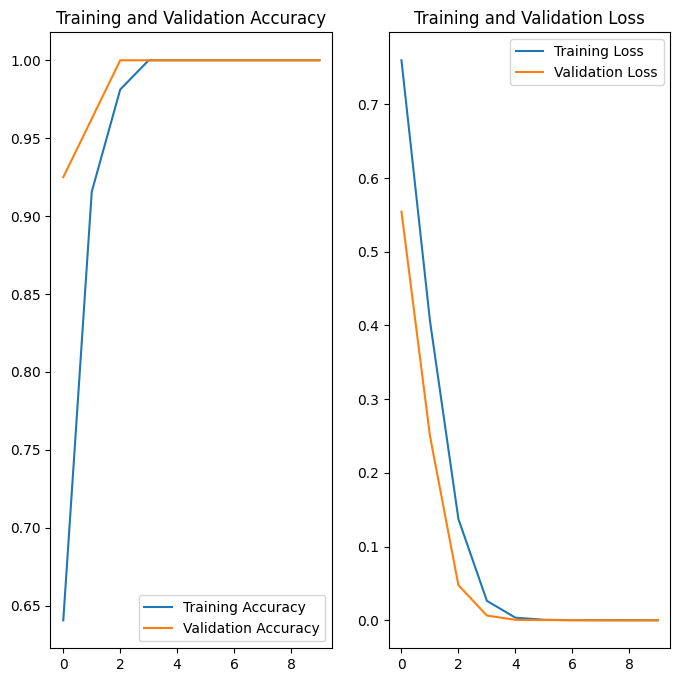

In [47]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [48]:
data_augmentation = keras.Sequential(
  [
    layers.RandomFlip("horizontal",
                      input_shape=(160,
                                  160,
                                  3)),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
  ]
)

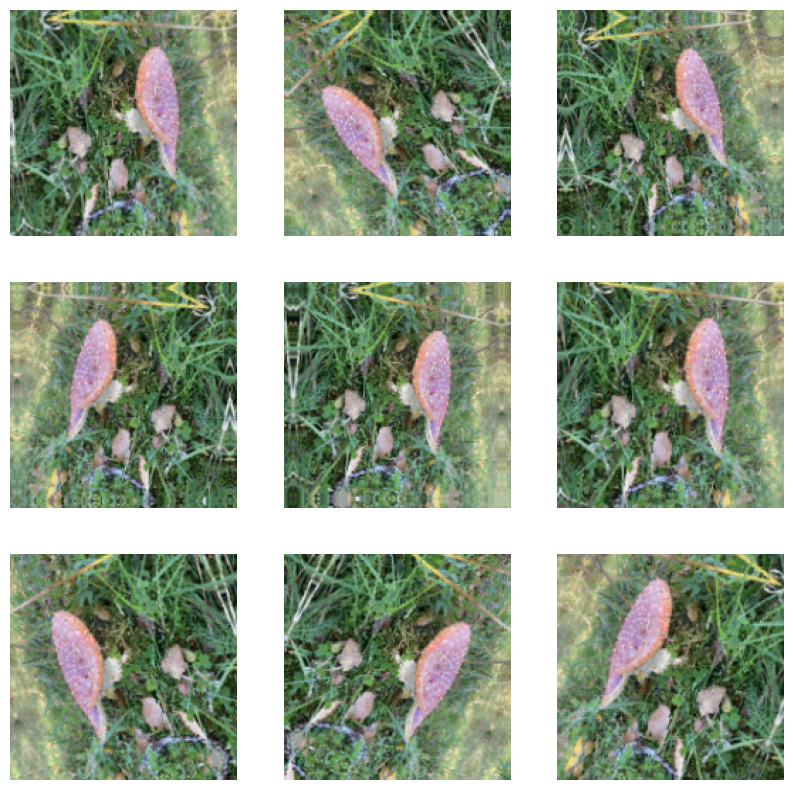

In [49]:
plt.figure(figsize=(10, 10))
for images, _ in train_dataset.take(1):
  for i in range(9):
    augmented_images = data_augmentation(images)
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(augmented_images[0].numpy().astype("uint8"))
    plt.axis("off")

In [50]:
model = Sequential([
  data_augmentation,
  layers.Rescaling(1./255),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout(0.2),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes, name="outputs")
])

In [51]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [53]:
epochs = 15
history = model.fit(
  train_dataset,
  validation_data=val_dataset,
  epochs=epochs
)

Epoch 1/15
10/10 [==============================] - 4s 286ms/step - loss: 1.0425 - accuracy: 0.4938 - val_loss: 0.6949 - val_accuracy: 0.4750
Epoch 2/15
10/10 [==============================] - 2s 251ms/step - loss: 0.6929 - accuracy: 0.5031 - val_loss: 0.6902 - val_accuracy: 0.5250
Epoch 3/15
10/10 [==============================] - 2s 249ms/step - loss: 0.6858 - accuracy: 0.5781 - val_loss: 0.6587 - val_accuracy: 0.5875
Epoch 4/15
10/10 [==============================] - 2s 243ms/step - loss: 0.6262 - accuracy: 0.6750 - val_loss: 0.5202 - val_accuracy: 0.7500
Epoch 5/15
10/10 [==============================] - 3s 253ms/step - loss: 0.4452 - accuracy: 0.8062 - val_loss: 0.4100 - val_accuracy: 0.8000
Epoch 6/15
10/10 [==============================] - 2s 240ms/step - loss: 0.3496 - accuracy: 0.8469 - val_loss: 0.1945 - val_accuracy: 0.9250
Epoch 7/15
10/10 [==============================] - 2s 250ms/step - loss: 0.2271 - accuracy: 0.8969 - val_loss: 0.1845 - val_accuracy: 0.9625
Epoch 

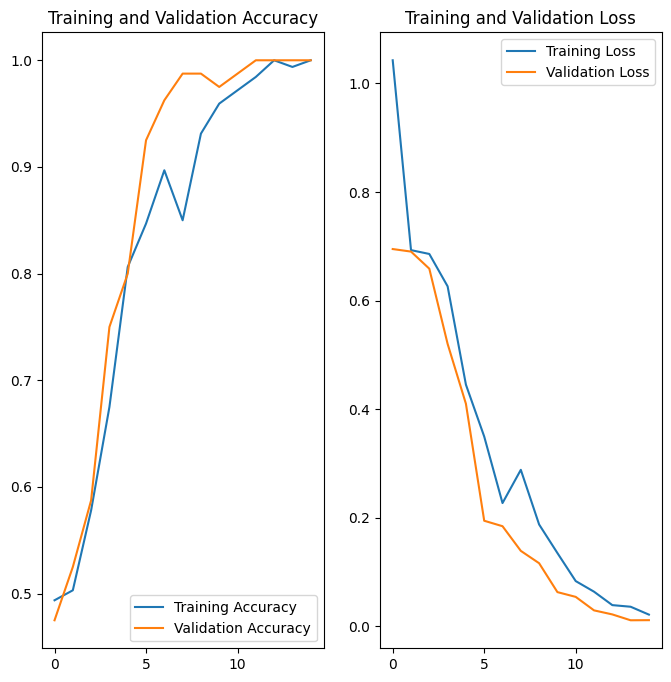

In [54]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [57]:
img = tf.keras.utils.load_img(
    'kantarellTest2.jpg', target_size=(160, 160)
)
img_array = tf.keras.utils.img_to_array(img)
img_array = tf.expand_dims(img_array, 0) # Create a batch

predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])

print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(class_names[np.argmax(score)], 100 * np.max(score))
)


1/1 [==============================] - 0s 23ms/step
This image most likely belongs to kantarell with a 99.99 percent confidence.


In [58]:
import os
model.save(os.path.join('models', 'flugVSkant.h5'))

c:\Users\HP\Desktop\VSCodeProjects\flugsvamp_vs_kantarell\venv\Lib\site-packages\keras\src\engine\training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [60]:
from tensorflow.keras.models import load_model

In [62]:
new_model = load_model(os.path.join('models', 'flugVSkant.h5'))

In [63]:
img = tf.keras.utils.load_img(
    'kantarellTest2.jpg', target_size=(160, 160)
)
img_array = tf.keras.utils.img_to_array(img)
img_array = tf.expand_dims(img_array, 0) # Create a batch

predictions = new_model.predict(img_array)
score = tf.nn.softmax(predictions[0])

print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(class_names[np.argmax(score)], 100 * np.max(score))
)

1/1 [==============================] - 0s 69ms/step
This image most likely belongs to kantarell with a 99.99 percent confidence.
